# Distance basis, TICA indicator bases
up to up+

In [1]:
import numpy as np
import extq
import matplotlib.pyplot as plt
from matplotlib import ticker
import pyemma
import glob
import sys
import importlib
import gc
import sklearn
from sklearn import metrics
import ivac
import seaborn as sns

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import kde

In [3]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

# Load feature 3 data

In [4]:
data_arr = np.load("../../data/raw_feat/feat3_ivac_ind200.npy")

In [5]:
print(len(data_arr))

6580000


## load CVs 

In [6]:
with np.load("../../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cv_arr = f["arr_0"]

In [7]:
livac_trajs = np.load("../../data/sb_ind100_TICA/livac_trajs.npy", allow_pickle=True)
livac_arr = np.concatenate(livac_trajs)
models_km100 = np.load("../../data/sb_ind100_TICA/models.npy", allow_pickle=True)

In [8]:
traj_lens = [len(traj) for traj in livac_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

In [9]:
with np.load("../../data/raw_feat/ri126_dist.npz", allow_pickle=True) as f:
    ri_trajs = f["arr_0"]
ri_arr = np.concatenate(ri_trajs)
ri_arr.shape

(6580000, 5)

In [10]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [11]:
# useful salt bridges
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids = [48, 54, 53, 59]

In [12]:
for idx in sb_ids:
    print(sb_labels[idx - 30])

R229 - D129
R232 - D129
R229 - D186
R232 - D186


In [13]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    sb_data = f["arr_0"]

In [14]:
print(len(sb_data))
print(sb_data[0].shape)

1295
(3000, 60)


In [15]:
sb_data_arr = np.concatenate(sb_data)
print(sb_data_arr.shape)

(6580000, 60)


In [16]:
cv_arr = np.hstack((cv_arr, sb_data_arr[:, sb_ids], ri_arr, livac_arr))

In [17]:
cv_arr.shape

(6580000, 16)

In [18]:
cv_trajs = np.split(cv_arr, traj_inds)

In [19]:
names = [
    "Distance / $\AA$",
    "Rotation / $^\circ$",
    "R229-D129",
    "R232-D129",
    "R229-D186",
    "R232-D186",
    "R217-I126",
    "R223-I126",
    "R226-I126",
    "R229-I126",
    "R232-I126",
    "iTIC0",
    "iTIC1",
    "iTIC2",
    "iTIC3",
    "iTIC4",
]

## remove duplicates 

In [20]:
remove = [
    1282,
    1283,
    1284,
    1285,
    1286,
    1288,
    1289,
    1290,
    1187,
    1188,
    1189,
    1190,
    1191,
    1197,
    1198,
    1199,
    1203,
    1205,
    1206,
    1207,
    1211,
    1212,
    1213,
    1214,
    1215,
    1225,
    1226,
    1227,
    1228,
    1231,
    1232,
    1233,
    1236,
    1237,
    1238,
    1242,
    1245,
    1246,
    1252,
    1253,
    1260,
    1261,
    1262,
    1263,
    1266,
    1267,
    1268,
    1269,
    1270,
    1271,
    1272,
    1273,
    1274,
    1275,
    1276,
    1277,
    1278,
    1279,
]

In [21]:
for idx in sorted(remove, reverse=True):
    del cv_trajs[idx]

In [22]:
cv_arr = np.concatenate(cv_trajs)

In [23]:
cv_arr.shape

(6000000, 16)

In [25]:
data_trajs = np.split(data_arr, traj_inds)
for idx in sorted(remove, reverse=True):
    del data_trajs[idx]

In [26]:
data = np.concatenate(data_trajs)

In [27]:
data.shape

(6000000,)

In [24]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

# States 

In [159]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = cv_arr[:, 14]
tic2 = cv_arr[:, 15]
sb5 = cv_arr[:, 5]  # R2-D186
sb6 = cv_arr[:, 6]  # R3-D186
sb7 = cv_arr[:, 7]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [160]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data[upplus_ids]
up = data[up_ids]
other = data[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]

NameError: name 'data' is not defined

In [ ]:
assert (len(uppplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(uppplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

## plot new states 

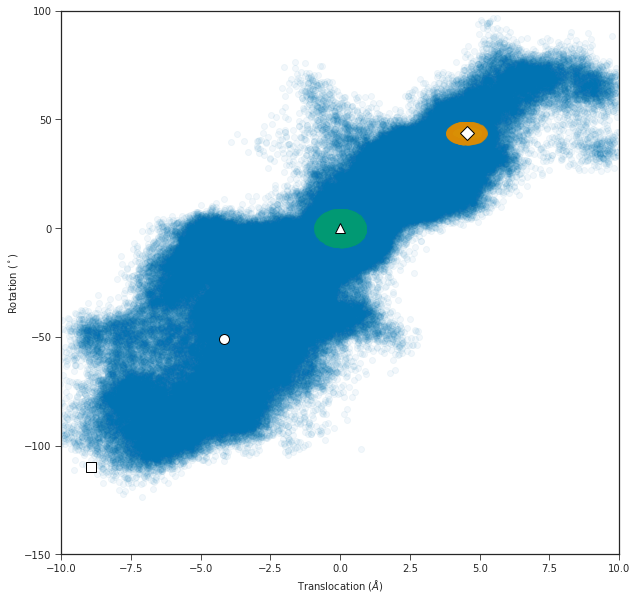

In [33]:
f, ax = plt.subplots(figsize=(10, 10))
ax.scatter(*other_cvs[::20, :2].T, alpha=0.05)
for cv_group in (upplus_cvs, up_cvs):
    ax.scatter(*cv_group[::20, :2].T, alpha=0.2)
util.format_cvs(ax)

# Basis set construction (feat3) 

In [23]:
guess_down = np.zeros_like(data)
guess_down[up_ids] = 1
guessD = np.split(guess_down, traj_inds)
guess_up = np.zeros_like(data)
guess_up[upplus_ids] = 1
guessU = np.split(guess_up, traj_inds)

NameError: name 'data' is not defined

In [76]:
guess_down.shape

(6000000,)

In [37]:
# indicator basis
basisF_arr = np.zeros((len(cv_arr), 200))
for i in range(200):
    basisF_arr[data == i, i] = 1

# enforce boundary conditions
basisF_arr[upplus_ids] = 0
basisF_arr[up_ids] = 0

In [38]:
assert basisF_arr[upplus_ids].all() == 0
assert basisF_arr[up_ids].all() == 0

In [39]:
# remove bases which are completely 0 (i.e. entirely contained in A U B)
nonzero = np.where(np.sum(basisF_arr, axis=0) > 0)[0]

basisF_arr = basisF_arr[:, nonzero]

In [40]:
basisF_arr.shape

(6000000, 200)

In [41]:
basisF = np.split(basisF_arr, traj_inds)

In [42]:
print(len(basisF), basisF[0].shape)

1237 (3000, 200)


In [143]:
# unit is 0.1 ps, up to 100 ns
lags = [1, 2, 5, 10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000, 2000]

## Load COM

In [44]:
weights_feat3 = np.load("../../data/coms_feat3_ind200_fix.npy", allow_pickle=True)

# Committors 

## all committors 

In [83]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights_feat3):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [84]:
np.save("../../data/feat3_ind200_uuu/q_du_feat3.npy", q_downup)
np.save("../../data/feat3_ind200_uuu/qb_du_feat3.npy", qb_downup)
np.save("../../data/feat3_ind200_uuu/q_ud_feat3.npy", q_updown)
np.save("../../data/feat3_ind200_uuu/qb_ud_feat3.npy", qb_updown)

In [163]:
q_downup_3 = np.load("../../data/feat3_ind200_uuu/q_du_feat3.npy", allow_pickle=True)
qb_downup_3 = np.load("../../data/feat3_ind200_uuu/qb_du_feat3.npy", allow_pickle=True)
q_updown_3 = np.load("../../data/feat3_ind200_uuu/q_ud_feat3.npy", allow_pickle=True)
qb_updown_3 = np.load("../../data/feat3_ind200_uuu/qb_ud_feat3.npy", allow_pickle=True)

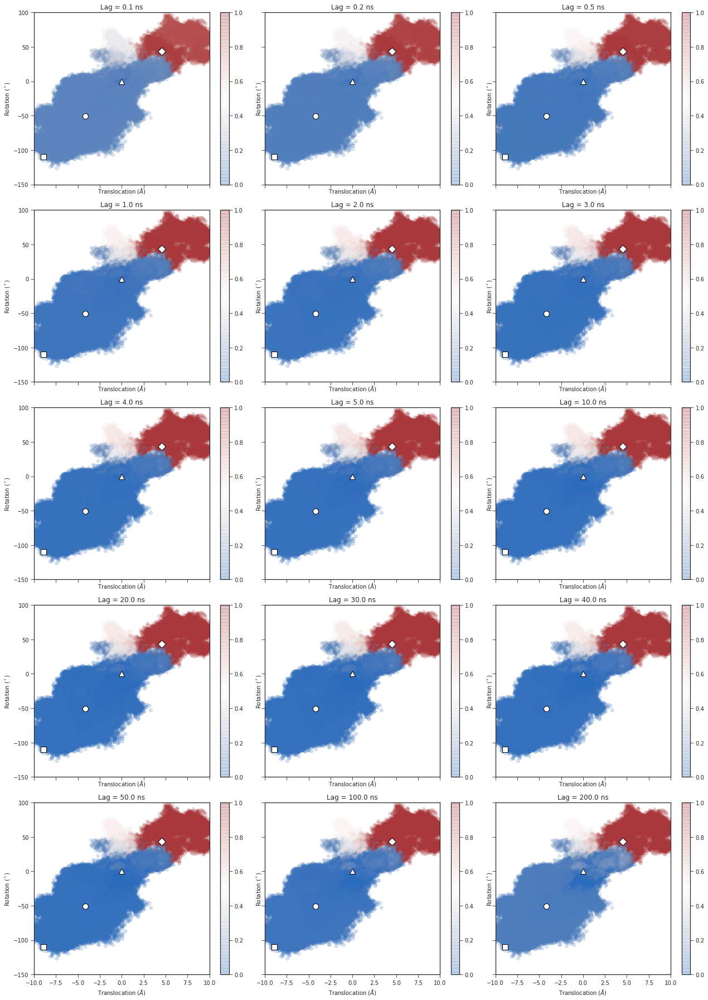

In [85]:
f, axs = plt.subplots(5, 3, figsize=(18, 25), sharex=True, sharey=True)
# accidentally flipped guess
for lag, q, ax in zip(lags, q_downup_3, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

In [50]:
feat2_models = np.load("../../data/models_feat2.npy")

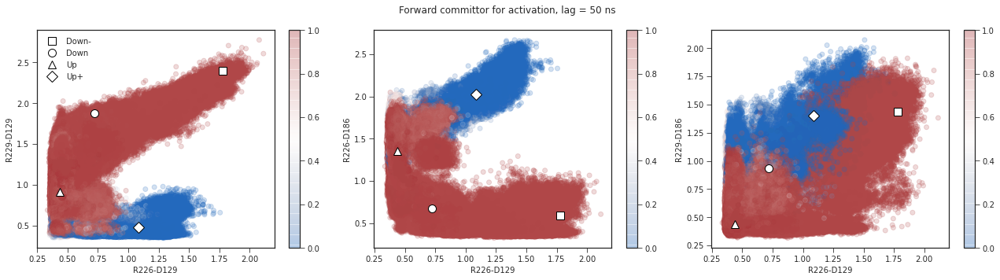

In [86]:
# projection on salt bridges
# R2-D129 vs R3-D129, R2-D186, R3-D186
f, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True)
q = np.concatenate(q_updown[13])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 3], cv_arr[::10, i + 4], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[3], ylabel=names[i + 4])
util.plot_models(axs[0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axs[1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axs[2], feat2_models[:, 42:54:11])  # 42 and 53
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

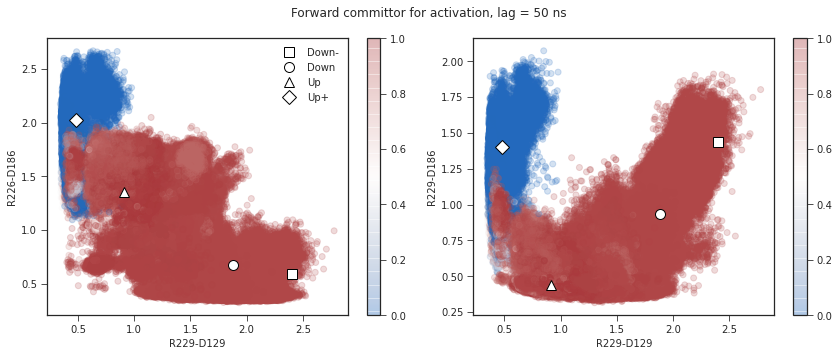

In [87]:
f, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
q = np.concatenate(q_updown[13])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 4], cv_arr[::10, i + 5], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[4], ylabel=names[i + 5])
util.plot_models(axs[0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axs[1], feat2_models[:, 48:54:5])  # 48 and 53
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

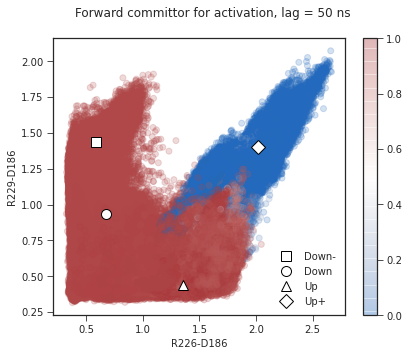

In [88]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_updown[13])
h = ax.scatter(cv_arr[::10, 5], cv_arr[::10, 6], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlabel=names[5], ylabel=names[6])
util.plot_models(ax, feat2_models[:, 47:54:6])  # 47 and 53
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

### Added 6/3/21 (better salt bridges))

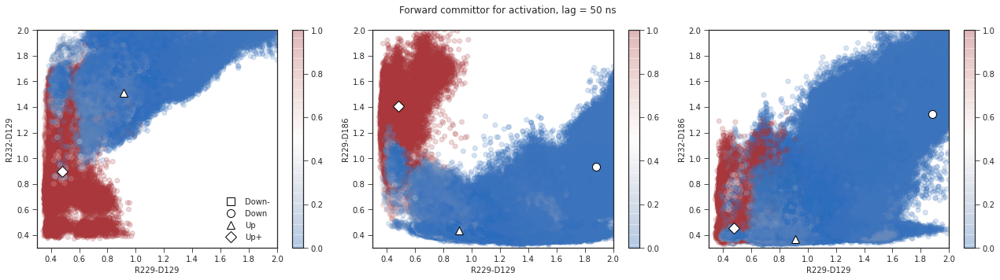

In [164]:
# projection on salt bridges
# R3-D129 vs
f, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True)
q = np.concatenate(q_downup_3[13])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 2], cv_arr[::10, i + 3], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[2], ylabel=names[i + 3], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axs[1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axs[2], feat2_models[:, 48:60:11])  # 48 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

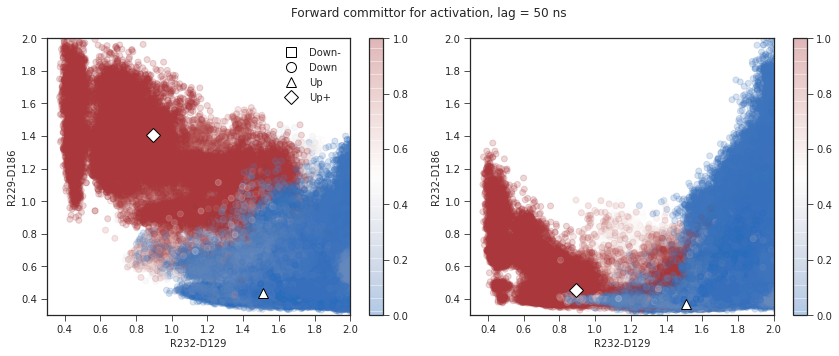

In [165]:
f, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
q = np.concatenate(q_downup_3[13])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 3], cv_arr[::10, i + 4], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[3], ylabel=names[i + 4], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axs[1], feat2_models[:, 54:60:5])  # 54 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  if sys.path[0] == '':


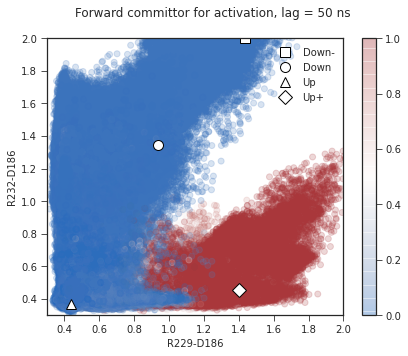

In [166]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup_3[13])
h = ax.scatter(cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlabel=names[4], ylabel=names[5], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(ax, feat2_models[:, 53:60:6])  # 53 and 59
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 50 ns")
f.tight_layout()

# Basis set construction with Feature 5 

In [24]:
data_arr_5 = np.load("../../data/raw_feat/feat5_ivac_ind200.npy")

In [25]:
print(len(data_arr_5))

6580000


In [27]:
orig_traj_lens = [len(traj) for traj in livac_trajs]
orig_traj_inds = []
subtot = 0
for length in orig_traj_lens[:-1]:
    subtot += length
    orig_traj_inds.append(subtot)

In [28]:
data_trajs_5 = np.split(data_arr_5, orig_traj_inds)
print(len(data_trajs_5))

1295


## remove extraneous data 

In [29]:
for idx in sorted(remove, reverse=True):
    del data_trajs_5[idx]

In [30]:
data_arr_5 = np.concatenate(data_trajs_5)

In [31]:
data_arr_5.shape

(6000000,)

In [148]:
len(data_trajs_5)

1237

In [149]:
np.save("../../data/raw_feat/feat5_ivac_ind200_fix.npy", data_trajs_5)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## make bases 

In [32]:
# indicator basis
basisF_arr_5 = np.zeros((len(cv_arr), 200))
for i in range(200):
    basisF_arr_5[data_arr_5 == i, i] = 1

# enforce boundary conditions
basisF_arr_5[upplus_ids] = 0
basisF_arr_5[up_ids] = 0

In [33]:
assert basisF_arr_5[upplus_ids].all() == 0
assert basisF_arr_5[up_ids].all() == 0

In [34]:
# remove bases which are completely 0 (i.e. entirely contained in A U B)
nonzero = np.where(np.sum(basisF_arr_5, axis=0) > 0)[0]

basisF_arr_5 = basisF_arr_5[:, nonzero]

In [35]:
basisF_arr_5.shape

(6000000, 200)

In [44]:
basisF_5 = np.split(basisF_arr_5, traj_inds)

In [45]:
print(len(basisF_5), basisF_5[0].shape)

1237 (3000, 200)


In [46]:
guess_down = np.zeros_like(data_arr_5)
guess_down[up_ids] = 1
guessD = np.split(guess_down, traj_inds)
guess_up = np.zeros_like(data_arr_5)
guess_up[upplus_ids] = 1
guessU = np.split(guess_up, traj_inds)

In [42]:
len(traj_inds)

1294

In [47]:
print(guess_down.shape, guess_up.shape)
assert np.all(guess_down[up_ids])
assert np.all(guess_down[upplus_ids]) == False
assert np.all(guess_up[up_ids]) == False
assert np.all(guess_up[upplus_ids])
print(len(guessD), len(guessU))

(6000000,) (6000000,)
1237 1237


In [48]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data_arr_5[upplus_ids]
up = data_arr_5[up_ids]
other = data_arr_5[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]

# Compute COM for feature 5 

In [68]:
weights_feat5 = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisF_5, lag)
    weights_feat5.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 30
Computing change of measure for lag 40
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 300
Computing change of measure for lag 400
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000


In [69]:
np.save("../../data/coms_feat5_ind200_fix.npy", weights_feat5)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [49]:
weights_feat5 = np.load("../../data/coms_feat5_ind200_fix.npy", allow_pickle=True)

# Committor calculations

In [53]:
in_domain = np.split(mask, traj_inds)
q_downup_5, qb_downup_5, q_updown_5, qb_updown_5 = [], [], [], []
for (lag, com) in zip(lags, weights_feat5):
    print(f"Calculating committors for lag {lag}")
    q_downup_5.append(extq.dga.forward_committor(basisF_5, com, in_domain, guessU, lag))
    qb_downup_5.append(
        extq.dga.backward_committor(basisF_5, com, in_domain, guessD, lag)
    )
    q_updown_5.append(extq.dga.forward_committor(basisF_5, com, in_domain, guessD, lag))
    qb_updown_5.append(
        extq.dga.backward_committor(basisF_5, com, in_domain, guessU, lag)
    )

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [54]:
np.save("../../data/feat5_ind200_uuu/q_du_feat5.npy", q_downup_5)
np.save("../../data/feat5_ind200_uuu/qb_du_feat5.npy", qb_downup_5)
np.save("../../data/feat5_ind200_uuu/q_ud_feat5.npy", q_updown_5)
np.save("../../data/feat5_ind200_uuu/qb_ud_feat5.npy", qb_updown_5)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [4]:
q_downup_5 = np.load("../../data/feat5_ind200_uuu/q_du_feat5.npy", allow_pickle=True)
qb_downup_5 = np.load("../../data/feat5_ind200_uuu/qb_du_feat5.npy", allow_pickle=True)
q_updown_5 = np.load("../../data/feat5_ind200_uuu/q_ud_feat5.npy", allow_pickle=True)
qb_updown_5 = np.load("../../data/feat5_ind200_uuu/qb_ud_feat5.npy", allow_pickle=True)

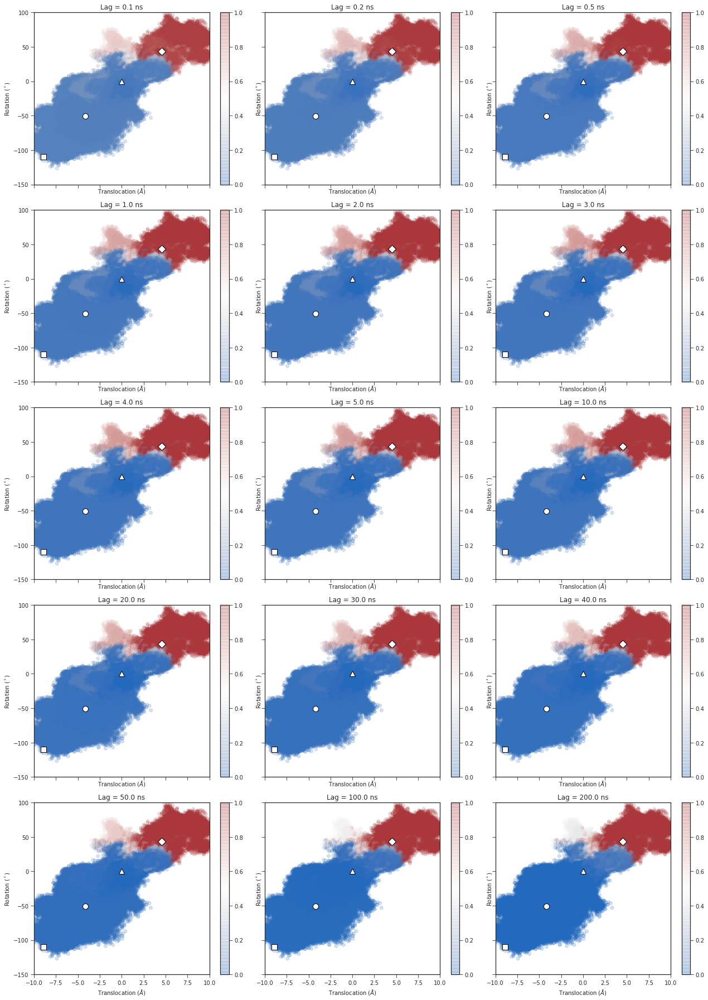

In [55]:
f, axs = plt.subplots(5, 3, figsize=(18, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup_5, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

In [5]:
feat2_models = np.load("../../data/models_feat2.npy")

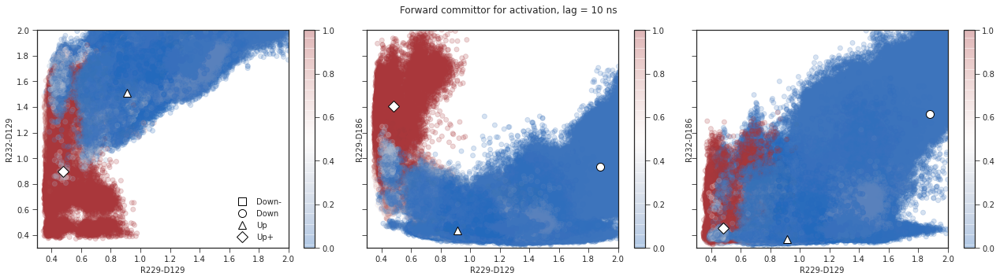

In [94]:
# projection on salt bridges
# R3-D129 vs
f, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=True)
q = np.concatenate(q_downup_5[8])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 2], cv_arr[::10, i + 3], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[2], ylabel=names[i + 3], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axs[1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axs[2], feat2_models[:, 48:60:11])  # 48 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

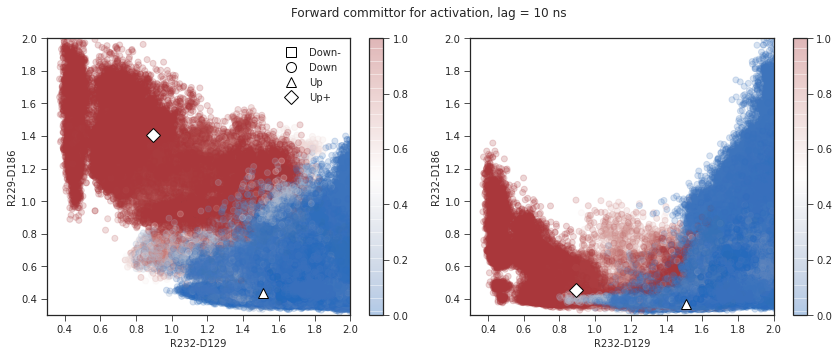

In [95]:
f, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
q = np.concatenate(q_downup_5[8])
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 3], cv_arr[::10, i + 4], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[3], ylabel=names[i + 4], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axs[1], feat2_models[:, 54:60:5])  # 54 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  if sys.path[0] == '':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


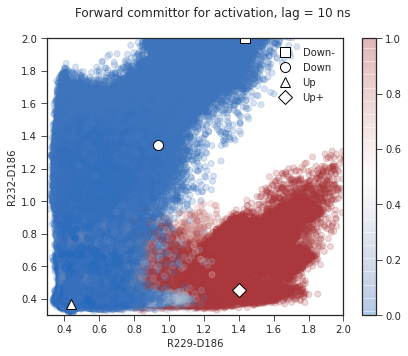

In [96]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup_5[8])
h = ax.scatter(cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlabel=names[4], ylabel=names[5], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(ax, feat2_models[:, 53:60:6])  # 53 and 59
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

### Committor 0.5 surface 

6.7.21

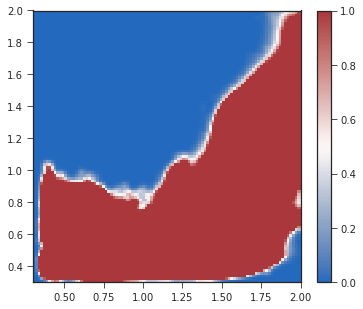

In [32]:
# in R229-D129 vs R232-D129 space
q = np.concatenate(q_downup_5[8])
q_kde, xedges, yedges = kde.kdesum2d(
    cv_arr[:, 2], cv_arr[:, 3], q, xmin=0.3, xmax=2.0, ymin=0.3, ymax=2.0
)

f, ax = plt.subplots(figsize=(6, 5))
h = ax.pcolor(xedges, yedges, q_kde, cmap="vlag", vmax=1.0)
plt.colorbar(h, ax=ax)

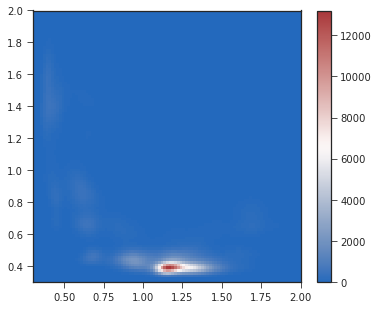

In [38]:
# in R229-D129 vs R229-D186 space
q = np.concatenate(q_downup_5[8])
q_kde, xedges, yedges = kde.kdesum2d(
    cv_arr[:, 2], cv_arr[:, 4], q, xmin=0.3, xmax=2.0, ymin=0.3, ymax=2.0
)

f, ax = plt.subplots(figsize=(6, 5))
h = ax.pcolor(xedges, yedges, q_kde, cmap="vlag")
plt.colorbar(h, ax=ax)

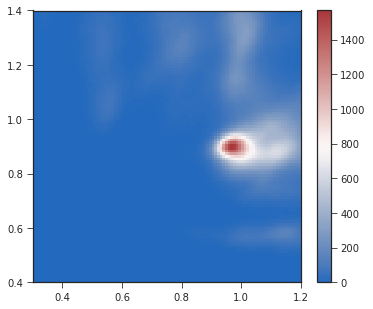

In [37]:
# in R232-D129 vs R229-D186 space
q = np.concatenate(q_downup_5[8])
q_kde, xedges, yedges = kde.kdesum2d(
    cv_arr[:, 3], cv_arr[:, 4], q, xmin=0.3, xmax=1.2, ymin=0.4, ymax=1.4
)

f, ax = plt.subplots(figsize=(6, 5))
h = ax.pcolor(xedges, yedges, q_kde, cmap="vlag")
plt.colorbar(h, ax=ax)

In [115]:
# q 0.5
ids = ((q - 0.5) ** 2).argsort()
for idx in ids[:20]:
    print(f"{util.frame(idx)}: {q[idx]}, {cv_arr[idx, :6]}")

(682, 2810): 0.4784785831013142, [ 4.343      37.843       0.48944369  1.62400043  1.02266586  0.38648432]
(601, 294): 0.4784785831013142, [ 3.735      26.425       0.58196056  1.84326768  1.09554791  0.40829161]
(601, 293): 0.4784785831013142, [ 3.845      25.428       0.48794046  1.80698919  1.16519392  0.40000492]
(601, 292): 0.4784785831013142, [ 3.995      26.387       0.46805283  1.86244333  1.20480072  0.40047702]
(601, 291): 0.4784785831013142, [ 3.975      25.85        0.46365955  1.83606195  1.17030728  0.39151475]
(601, 290): 0.4784785831013142, [ 3.913      26.738       0.45445099  1.80592167  1.18195486  0.372549  ]
(601, 289): 0.4784785831013142, [ 3.896      27.051       0.49236786  1.86837137  1.23382568  0.40421161]
(601, 288): 0.4784785831013142, [ 4.01       30.914       0.51712543  1.83291543  1.15338612  0.38804492]
(1030, 293): 0.4784785831013142, [ 4.137      30.193       0.7079075   1.46587765  0.52521431  0.39603034]
(601, 287): 0.4784785831013142, [ 4.179     

682: R3 somewhat at/above the level of the hydrophobic plug, close enough to be interacting with D129 (4.9 Å distance), while R4 still sticking quite far down

601: Remarkably similar to 682, in that R3 is mostly up (it appears that the I129 has somewhat shifted to accomodate passage) with R4 down

1030: S4 helix is up, but the "head" of R3 is still stuck below plug (hysteresis)

719: very close to up+ state, both R3 and R4 mostly in their correct positions

556: in first 200 frames, theres some "clicking" motion of R3 below and above the hydrophobic plug which is quite subtle

In [114]:
# q 0.5
ids = ((q - 0.5) ** 2).argsort()
for idx in ids[:700]:
    traj, _ = util.frame(idx)
    if traj != 601 and traj != 556:
        print(f"{util.frame(idx)}: {q[idx]}, {cv_arr[idx, :6]}")

(682, 2810): 0.4784785831013142, [ 4.343      37.843       0.48944369  1.62400043  1.02266586  0.38648432]
(1030, 293): 0.4784785831013142, [ 4.137      30.193       0.7079075   1.46587765  0.52521431  0.39603034]
(719, 1505): 0.4784785831013142, [ 1.806      20.432       0.38681236  1.0906297   1.13592315  0.41195861]
(719, 1506): 0.4784785831013142, [ 1.991      19.873       0.40032744  1.21363974  1.19453204  0.38542697]
(1030, 734): 0.4784785831013142, [ 4.562      31.234       0.64181161  1.30606437  0.66253841  0.65470839]
(1030, 728): 0.4784785831013142, [ 4.457      31.197       0.62411702  1.30428648  0.7797603   0.65007925]
(1030, 348): 0.4784785831013142, [ 5.205      29.037       0.61888695  1.335145    0.53744304  0.39251241]
(1030, 771): 0.4784785831013142, [ 4.223      32.385       0.73936594  1.368981    0.59854168  0.76962662]
(1023, 4089): 0.4784785831013142, [ 2.34       11.709       0.95640212  1.65685308  0.61995566  0.37822488]
(1030, 1987): 0.4784785831013142, [ 

In [125]:
# q 0.5
ids = ((q - 0.5) ** 2).argsort()
for idx in ids[10000:30000]:
    traj, _ = util.frame(idx)
    if q[idx] > 0.5:
        print(f"{util.frame(idx)}: {q[idx]}, {cv_arr[idx, :6]}")

(1145, 9645): 0.5412454746045097, [ 6.114      32.57        0.65621567  1.36951101  0.84190798  0.63397956]
(1145, 9642): 0.5412454746045097, [ 5.927      32.575       0.63923389  1.38754034  0.84626895  0.56443524]
(1145, 9643): 0.5412454746045097, [ 5.912      28.938       0.62017906  1.45637023  0.89635712  0.49671307]
(1142, 7402): 0.5412454746045097, [ 2.783      27.145       0.62376451  1.7864598   0.98309612  0.39031532]
(1142, 7408): 0.5412454746045097, [ 2.628      29.883       0.5640496   1.64690161  0.89762694  0.40750092]
(1142, 7405): 0.5412454746045097, [ 3.084      29.328       0.59129184  1.63121951  0.84846395  0.38632366]
(1145, 9629): 0.5412454746045097, [ 5.09       32.849       0.62134218  1.25433707  0.83510542  0.37717637]
(1145, 9646): 0.5412454746045097, [ 5.768      33.695       0.65474421  1.452057    0.88283694  0.62868935]
(1145, 9644): 0.5412454746045097, [ 6.087      32.46        0.64973533  1.45659065  0.89431828  0.45231953]
(1142, 7458): 0.541245474604

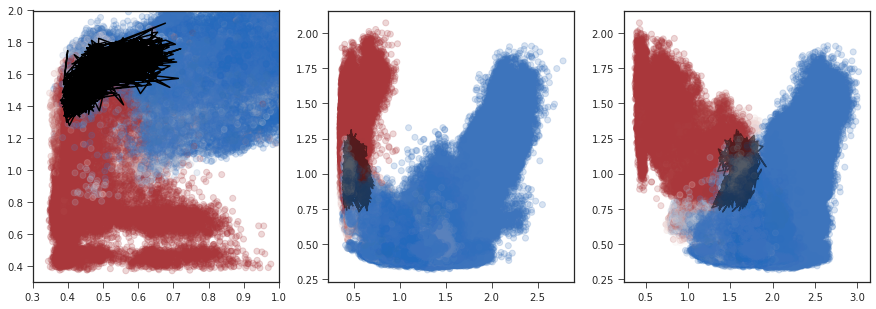

In [60]:
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5))
ax0.scatter(cv_arr[::10, 2], cv_arr[::10, 3], c=q[::10], cmap="vlag", alpha=0.2)
ax0.plot(cv_trajs[682][:, 2], cv_trajs[682][:, 3], "k")
ax0.set(xlim=[0.3, 1.0], ylim=[0.3, 2.0])
ax1.scatter(cv_arr[::10, 2], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax1.plot(cv_trajs[682][:, 2], cv_trajs[682][:, 4], "k", alpha=0.5)
ax2.scatter(cv_arr[::10, 3], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax2.plot(cv_trajs[682][:, 3], cv_trajs[682][:, 4], "k", alpha=0.5)

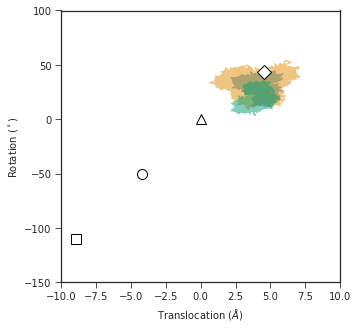

In [97]:
%matplotlib inline
f = plt.figure(figsize=(5, 5))
ax = f.add_subplot()
ax.plot(cv_trajs[682][:, 0], cv_trajs[682][:, 1], alpha=0.5)
ax.plot(cv_trajs[1030][:, 0], cv_trajs[1030][:, 1], alpha=0.5)
ax.plot(cv_trajs[556][:, 0], cv_trajs[556][:, 1], alpha=0.5)
util.format_cvs(ax)

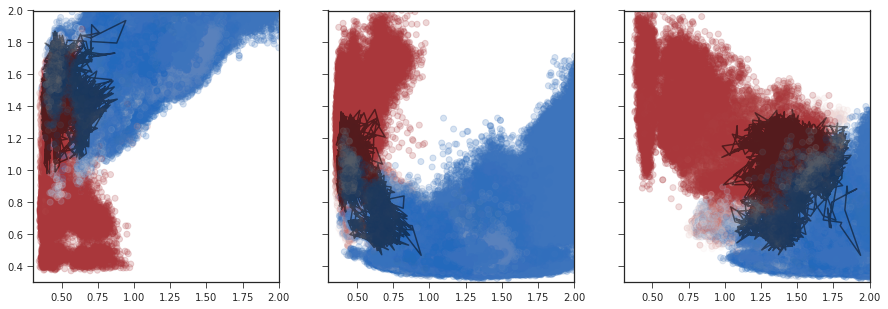

In [61]:
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax0.scatter(cv_arr[::10, 2], cv_arr[::10, 3], c=q[::10], cmap="vlag", alpha=0.2)
ax0.plot(cv_trajs[1030][:, 2], cv_trajs[1030][:, 3], "k", alpha=0.5)
ax0.set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
ax1.scatter(cv_arr[::10, 2], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax1.plot(cv_trajs[1030][:, 2], cv_trajs[1030][:, 4], "k", alpha=0.5)
ax2.scatter(cv_arr[::10, 3], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax2.plot(cv_trajs[1030][:, 3], cv_trajs[1030][:, 4], "k", alpha=0.5)

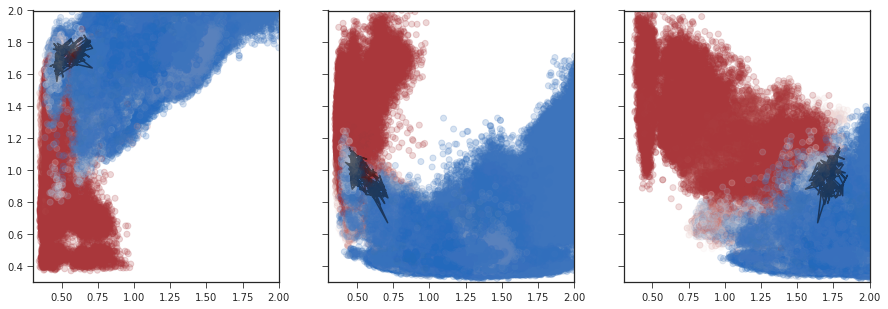

In [62]:
f, (ax0, ax1, ax2) = plt.subplots(1, 3, figsize=(15, 5), sharex=True, sharey=True)
ax0.scatter(cv_arr[::10, 2], cv_arr[::10, 3], c=q[::10], cmap="vlag", alpha=0.2)
ax0.plot(cv_trajs[556][:200, 2], cv_trajs[556][:200, 3], "k", alpha=0.5)
ax0.set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
ax1.scatter(cv_arr[::10, 2], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax1.plot(cv_trajs[556][:200, 2], cv_trajs[556][:200, 4], "k", alpha=0.5)
ax2.scatter(cv_arr[::10, 3], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2)
ax2.plot(cv_trajs[556][:200, 3], cv_trajs[556][:200, 4], "k", alpha=0.5)

In [69]:
# what about points near 0.6, 1.0 in R3-D129 / R4-D129 space?
# q 0.5
ids = ((q - 0.5) ** 2 + (cv_arr[:, 2] - 0.6) ** 2 + (cv_arr[:, 3] - 1.0) ** 2).argsort()
for idx in ids[:10]:
    traj, _ = util.frame(idx)
    print(f"{util.frame(idx)}: {q[idx]:.3f}, {cv_arr[idx, :6]}")

(1192, 2647): 0.478, [ 4.412      29.394       0.59937638  1.00490057  0.64818668  0.39125568]
(331, 390): 0.478, [ 3.759      30.777       0.6024822   0.9954623   0.66742361  0.3991566 ]
(717, 1895): 0.478, [ 4.556      24.245       0.60105377  0.99358588  0.70326763  0.39171168]
(1039, 457): 0.478, [ 4.368      27.905       0.59660625  1.00722456  0.62106526  0.37464643]
(1039, 4181): 0.478, [ 4.057      37.286       0.60628211  0.99445671  0.65939742  0.38793936]
(747, 1785): 0.478, [ 4.365      23.618       0.59041852  1.00104094  0.70408887  0.3728056 ]
(717, 1558): 0.478, [ 4.826      26.912       0.59042877  0.99886733  0.69848478  0.39650866]
(331, 769): 0.478, [ 4.42       28.909       0.60321325  0.98924708  0.68099672  0.38721955]
(1039, 2677): 0.478, [ 4.618      34.493       0.5944317   0.99021524  0.69938117  0.40042108]
(1192, 5352): 0.478, [ 4.593      31.304       0.61122268  0.99651498  0.67689598  0.40237433]


In [74]:
# what about points near 0.9, 0.7 in R4-D129 space / R3-D186?
# q 0.5
ids = ((q - 0.5) ** 2 + (cv_arr[:, 3] - 0.9) ** 2 + (cv_arr[:, 4] - 0.7) ** 2).argsort()
for idx in ids[:10]:
    traj, _ = util.frame(idx)
    print(f"{util.frame(idx)}: {q[idx]:.3f}, {cv_arr[idx, :6]}")

(717, 1498): 0.478, [ 4.723      24.101       0.49539     0.89949661  0.69811893  0.38270769]
(717, 1932): 0.478, [ 4.998      22.392       0.46081018  0.90086031  0.70245522  0.39854994]
(946, 1520): 0.478, [ 3.295      26.569       0.44842613  0.902843    0.70141721  0.3950116 ]
(717, 2363): 0.478, [ 3.37       28.482       0.48028019  0.90234452  0.69735718  0.41399777]
(946, 2785): 0.478, [ 3.167      35.575       0.4924449   0.89999843  0.6957708   0.38608018]
(717, 2384): 0.478, [ 3.482      26.132       0.4878723   0.89553297  0.6977514   0.39029869]
(717, 1877): 0.478, [ 4.991      17.883       0.58420396  0.90211368  0.70469999  0.39433098]
(717, 2827): 0.478, [ 3.502      23.04        0.45742539  0.89496708  0.70192653  0.39586991]
(717, 1885): 0.478, [ 4.487      19.825       0.48870838  0.89600748  0.7040571   0.39007822]
(946, 1511): 0.478, [ 3.567      25.97        0.48566988  0.90239298  0.69469404  0.3916555 ]


In [77]:
names[3:5]

['R232-D129', 'R229-D186']

### 3d projections of committor

6.8.21

In [135]:
%matplotlib widget

In [136]:
sb_ids

[48, 54, 53, 59]

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

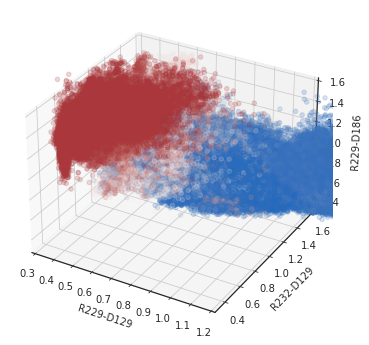

In [137]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 2], cv_arr[::10, 3], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[2], ylabel=names[3], xlim=[0.3, 1.2], ylim=[0.3, 1.6])
ax.set_zlabel(names[4])
ax.set_zlim([0.3, 1.6])
ax.plot(
    feat2_models[0, sb_ids[0]],
    feat2_models[0, sb_ids[1]],
    feat2_models[0, sb_ids[2]],
    "s",
    mec="k",
    mfc="w",
    ms=10,
)
ax.plot(
    feat2_models[1, sb_ids[0]],
    feat2_models[1, sb_ids[1]],
    feat2_models[1, sb_ids[2]],
    "s",
    mec="k",
    mfc="w",
    ms=10,
)

plt.show()

In [88]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 2], cv_arr[::10, 3], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[2], ylabel=names[3], xlim=[0.3, 1.2], ylim=[0.3, 1.6])
ax.set_zlabel(names[5])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [89]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 2], cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[2], ylabel=names[4], xlim=[0.3, 1.6], ylim=[0.3, 1.6])
ax.set_zlabel(names[5])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [90]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 3], cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[3], ylabel=names[4], xlim=[0.3, 1.6], ylim=[0.3, 1.6])
ax.set_zlabel(names[5])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [91]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], cv_arr[::10, 2], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[0], ylabel=names[1], xlim=[-1, 8], ylim=[-10, 80])
ax.set_zlabel(names[2])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [92]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], cv_arr[::10, 3], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[0], ylabel=names[1], xlim=[-1, 8], ylim=[-10, 80])
ax.set_zlabel(names[3])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

In [93]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], cv_arr[::10, 4], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[0], ylabel=names[1], xlim=[-1, 8], ylim=[-10, 80])
ax.set_zlabel(names[4])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

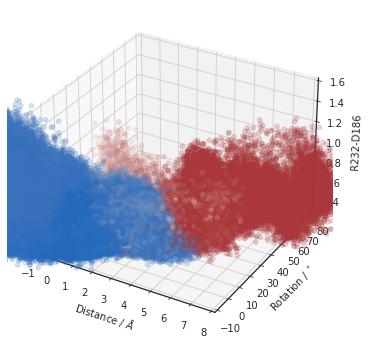

In [109]:
%matplotlib widget
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

ax.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2
)
ax.set(xlabel=names[0], ylabel=names[1], xlim=[-1, 8], ylim=[-10, 80])
ax.set_zlabel(names[5])
ax.set_zlim([0.3, 1.6])
# ax.scatter(feat2_models[0, sb_ids[0]], feat2_models[0, sb_ids[1]], feat2_models[0, sb_ids[3]], 'sw', edgecolors='k', s=10)
# ax.scatter(feat2_models[1, sb_ids[0]], feat2_models[1, sb_ids[1]], feat2_models[1, sb_ids[3]], 'ow', edgecolors='k', s=10)

plt.show()

In [102]:
high_trajs = []
# Cutoff using TICA: which trajectories?
for i, traj in enumerate(cv_trajs):
    nonzero = ((traj[:, 1] > 50) & (traj[:, 0] < 2)).nonzero()
    # trajectories with more than 500 frames (100 ns)
    if len(nonzero[0]) > 500:
        high_trajs.append(i)
        print(i, len(nonzero[0]))

209 2135
474 644
651 871
662 2683


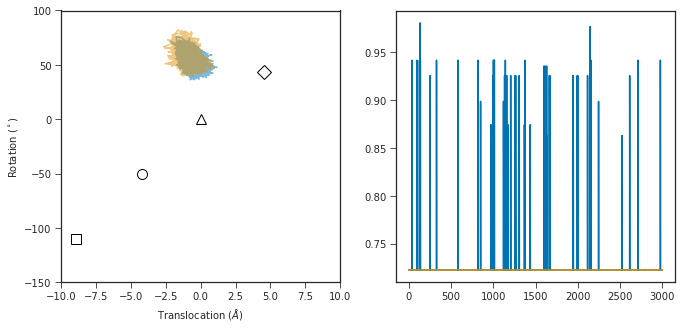

In [108]:
%matplotlib inline
f = plt.figure(figsize=(11, 5))
ax = f.add_subplot(121)
ax.plot(cv_trajs[209][:, 0], cv_trajs[209][:, 1], alpha=0.5)
ax.plot(cv_trajs[662][:, 0], cv_trajs[662][:, 1], alpha=0.5)
# ax.plot(cv_trajs[556][:, 0], cv_trajs[556][:, 1], alpha=0.5)
util.format_cvs(ax)

ax2 = f.add_subplot(122)
ax2.plot(q_downup_5[8][209])
ax2.plot(q_downup_5[8][662])

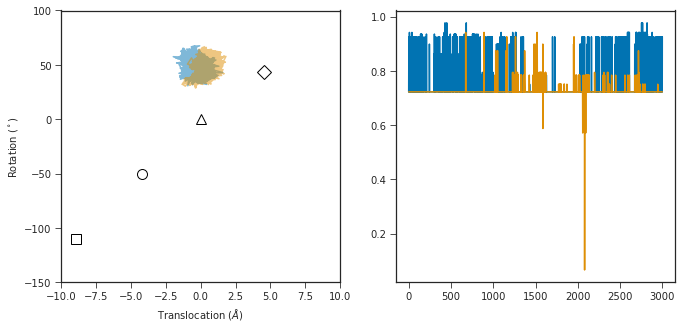

In [110]:
%matplotlib inline
f = plt.figure(figsize=(11, 5))
ax = f.add_subplot(121)
ax.plot(cv_trajs[474][:, 0], cv_trajs[474][:, 1], alpha=0.5)
ax.plot(cv_trajs[651][:, 0], cv_trajs[651][:, 1], alpha=0.5)
# ax.plot(cv_trajs[556][:, 0], cv_trajs[556][:, 1], alpha=0.5)
util.format_cvs(ax)

ax2 = f.add_subplot(122)
ax2.plot(q_downup_5[8][474])
ax2.plot(q_downup_5[8][651])

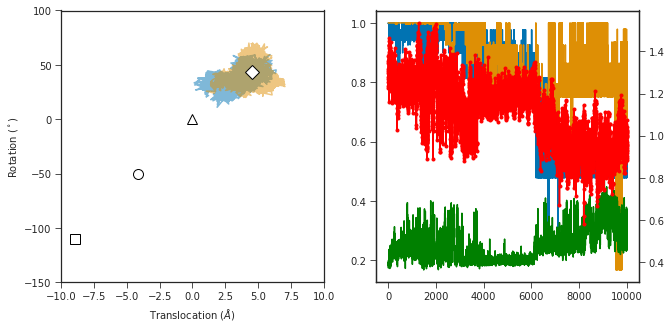

In [132]:
%matplotlib inline
f = plt.figure(figsize=(16, 5))
ax = f.add_subplot(131)
ax.plot(cv_trajs[1142][:, 0], cv_trajs[1142][:, 1], alpha=0.5)
ax.plot(cv_trajs[1145][:, 0], cv_trajs[1145][:, 1], alpha=0.5)
# ax.plot(cv_trajs[556][:, 0], cv_trajs[556][:, 1], alpha=0.5)
util.format_cvs(ax)

ax2 = f.add_subplot(132)
ax2.plot(q_downup_5[8][1142])
ax2.plot(q_downup_5[8][1145])

ax3 = ax2.twinx()
ax3.plot(cv_trajs[1142][:, 2], "g-")
ax3.plot(cv_trajs[1142][:, 4], "r.-")

# f.tight_layout()

#### Correlation between committor and CVs 

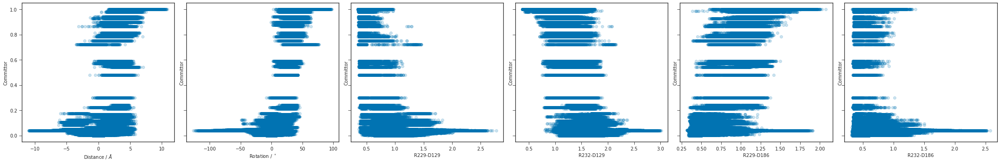

In [134]:
f, axs = plt.subplots(1, 6, figsize=(30, 5), sharey=True)
for i, ax in enumerate(axs):
    ax.scatter(cv_arr[::10, i], q[::10], alpha=0.2)
    ax.set_xlabel(names[i])
    ax.set_ylabel("Committor")
f.tight_layout()

# Feature 2 (distance basis)

In [104]:
sb_data = list(sb_data)
len(sb_data)

1295

In [105]:
for idx in sorted(remove, reverse=True):
    del sb_data[idx]

In [106]:
sb_data_arr = np.concatenate(sb_data)

In [107]:
sb_data_arr.shape

(6000000, 60)

In [147]:
np.save("../../data/raw_feat/feat2_raw_fix", sb_data, allow_pickle=True)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## Pairwise distances

In [110]:
# change up/up+
up = sb_data_arr[up_ids]
upplus = sb_data_arr[upplus_ids]
other = sb_data_arr[mask]

In [111]:
assert len(up) + len(upplus) + len(other) == len(sb_data_arr)

In [101]:
print(sklearn.get_config()["working_memory"])

1024


In [102]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [112]:
d_up = []
counter = 0.0
tot = len(sb_data_arr)
skip = 3

for chunk in metrics.pairwise_distances_chunked(
    sb_data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.07% completed
0.15% completed
0.22% completed
0.29% completed
0.37% completed
0.44% completed
0.52% completed
0.59% completed
0.66% completed
0.74% completed
0.81% completed
0.88% completed
0.96% completed
1.03% completed
1.10% completed
1.18% completed
1.25% completed
1.33% completed
1.40% completed
1.47% completed
1.55% completed
1.62% completed
1.69% completed
1.77% completed
1.84% completed
1.92% completed
1.99% completed
2.06% completed
2.14% completed
2.21% completed
2.28% completed
2.36% completed
2.43% completed
2.50% completed
2.58% completed
2.65% completed
2.73% completed
2.80% completed
2.87% completed
2.95% completed
3.02% completed
3.09% completed
3.17% completed
3.24% completed
3.31% completed
3.39% completed
3.46% completed
3.54% completed
3.61% completed
3.68% completed
3.76% completed
3.83% completed
3.90% completed
3.98% completed
4.05% completed
4.13% completed
4.20% completed
4.27% completed
4.35% completed
4.42% completed
4.49% completed
4.57% completed
4.64% co

In [113]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

1358 (4420,)
(6000000, 1)
0.97510415
0.0
(6000000, 1)


In [114]:
np.save("../../data/feat2_dist_fix/dist_up", d_up_arr)

In [126]:
d_up_arr = np.load("../../data/feat2_dist_fix/dist_up.npy")

### Up+state

In [127]:
d_upp = []
counter = 0.0
skip = 3

for chunk in metrics.pairwise_distances_chunked(
    sb_data_arr, upplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.13% completed
0.25% completed
0.38% completed
0.51% completed
0.64% completed
0.76% completed
0.89% completed
1.02% completed
1.15% completed
1.27% completed
1.40% completed
1.53% completed
1.66% completed
1.78% completed
1.91% completed
2.04% completed
2.17% completed
2.29% completed
2.42% completed
2.55% completed
2.67% completed
2.80% completed
2.93% completed
3.06% completed
3.18% completed
3.31% completed
3.44% completed
3.57% completed
3.69% completed
3.82% completed
3.95% completed
4.08% completed
4.20% completed
4.33% completed
4.46% completed
4.59% completed
4.71% completed
4.84% completed
4.97% completed
5.09% completed
5.22% completed
5.35% completed
5.48% completed
5.60% completed
5.73% completed
5.86% completed
5.99% completed
6.11% completed
6.24% completed
6.37% completed
6.50% completed
6.62% completed
6.75% completed
6.88% completed
7.01% completed
7.13% completed
7.26% completed
7.39% completed
7.51% completed
7.64% completed
7.77% completed
7.90% completed
8.02% co

In [128]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

786 (7642,)
(6000000, 1)
4.2824345
0.0
(6000000, 1)


In [129]:
np.save("../../data/feat2_dist_fix/dist_upplus", d_upp_arr)

## Smoothing, whitening/basis construction

In [151]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [152]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(6000000, 1) (6000000, 1) (6000000, 1)


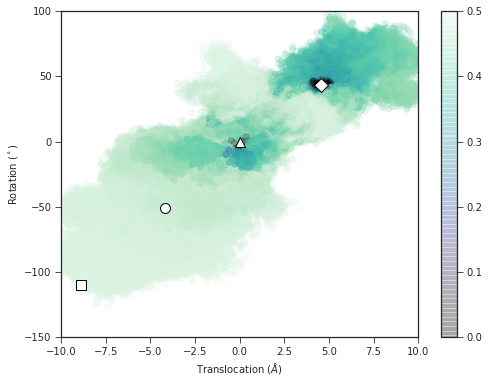

In [153]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

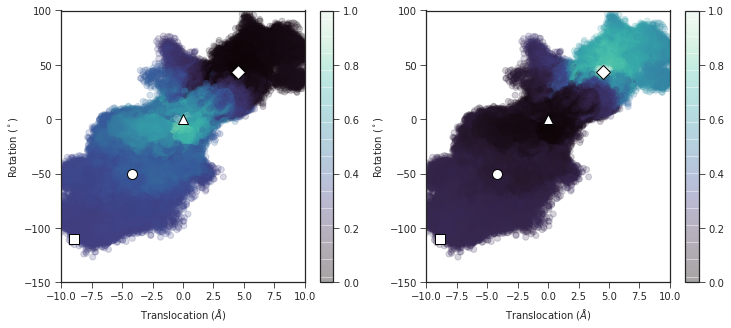

In [154]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [135]:
basis_smooth = smooth * sb_data_arr
print(basis_smooth.shape)
basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.0)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(6000000, 60)
(6000000, 59)


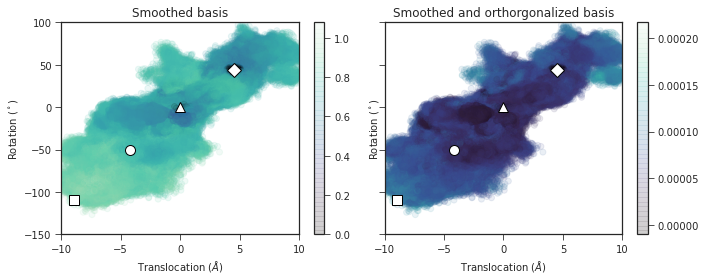

In [136]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

In [137]:
np.save("../../data/feat2_dist_fix/basis_white_uuu.npy", basis_white)
np.save("../../data/feat2_dist_fix/guess_up_uuu.npy", guess_up)
np.save("../../data/feat2_dist_fix/guess_upplus_uuu.npy", guess_upp)

In [157]:
basis_white = np.load("../../data/feat2_dist_fix/basis_white_uuu.npy")
guess_up = np.load("../../data/feat2_dist_fix/guess_up_uuu.npy")
guess_upp = np.load("../../data/feat2_dist_fix/guess_upplus_uuu.npy")

### Make bases

In [158]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

1237 (3000, 59)
1237
1237


## Compute change of measure

In [141]:
weights_feat2 = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(sb_data, lag)
    weights_feat2.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 30
Computing change of measure for lag 40
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 300
Computing change of measure for lag 400
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000


In [142]:
np.save("../../data/coms_feat2_fix.npy", weights_feat2)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## PMFs 

In [143]:
dens_all = []
dist_trajs = [traj[:, 0] for traj in cv_trajs]
rot_trajs = [traj[:, 1] for traj in cv_trajs]
xlim = np.linspace(-10, 10, 50)
ylim = np.linspace(-150, 100, 50)

for (com, lag) in zip(weights_feat2, lags):
    print(f"Density for lag {lag}")
    dens_all.append(extq.projection.density2d(dist_trajs, rot_trajs, com, xlim, ylim))

Density for lag 1
Density for lag 2
Density for lag 5
Density for lag 10
Density for lag 20
Density for lag 30
Density for lag 40
Density for lag 50
Density for lag 100
Density for lag 200
Density for lag 300
Density for lag 400
Density for lag 500
Density for lag 1000
Density for lag 2000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in log
  
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log
  if __name__ == '__main__':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: No contour levels were found within the

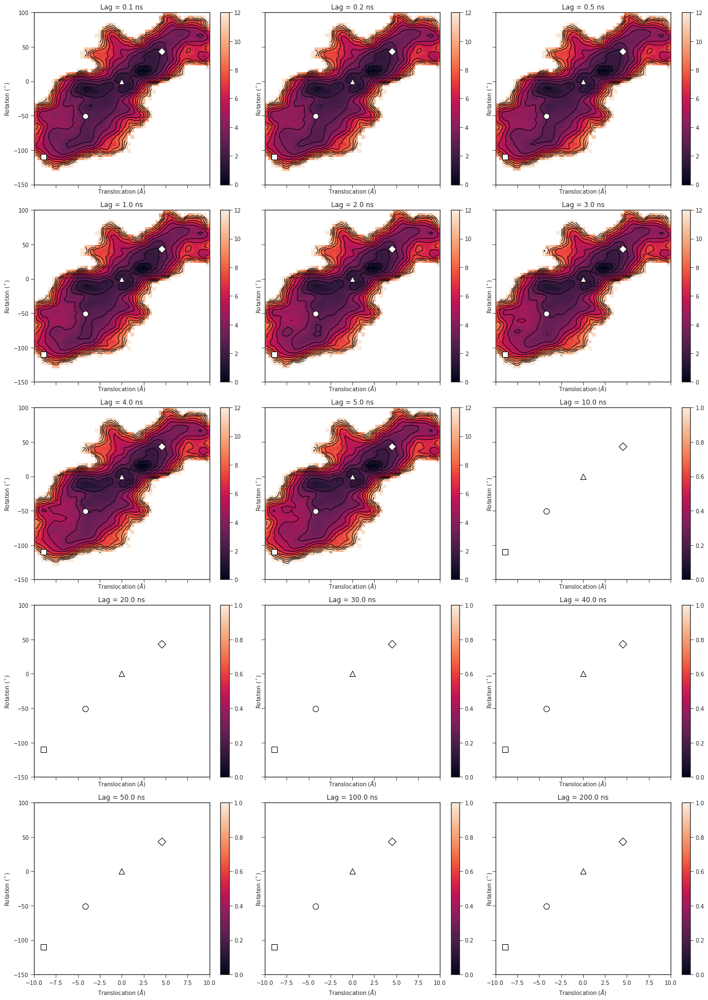

In [144]:
clines = np.linspace(0, 12, 13)
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2

f, axes = plt.subplots(5, 3, figsize=(18, 25), sharex=True, sharey=True)
for i, (lag, ax, pmf) in enumerate(zip(lags, axes.flat, dens_all)):
    # calculate energy difference against minimum
    min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
    diff = -np.log(pmf.T) - min_energy
    h = ax.pcolor(xlim, ylim, diff, cmap="rocket", vmax=12)
    plt.colorbar(h, ax=ax)
    ax.contour(
        centerx,
        centery,
        diff,
        levels=clines,
        colors="black",
        linestyles="solid",
        linewidths=1,
    )
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

## Committors 

In [157]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights_feat2):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [158]:
np.save("../../data/feat2_dist_fix/q_du_feat2.npy", q_downup)
np.save("../../data/feat2_dist_fix/qb_du_feat2.npy", qb_downup)
np.save("../../data/feat2_dist_fix/q_ud_feat2.npy", q_updown)
np.save("../../data/feat2_dist_fix/qb_ud_feat2.npy", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [140]:
q_downup_2 = np.load("../../data/feat2_dist_fix/q_du_feat2.npy", allow_pickle=True)
qb_downup_2 = np.load("../../data/feat2_dist_fix/qb_du_feat2.npy", allow_pickle=True)
q_updown_2 = np.load("../../data/feat2_dist_fix/q_ud_feat2.npy", allow_pickle=True)
qb_updown_2 = np.load("../../data/feat2_dist_fix/qb_ud_feat2.npy", allow_pickle=True)

In [142]:
%matplotlib inline

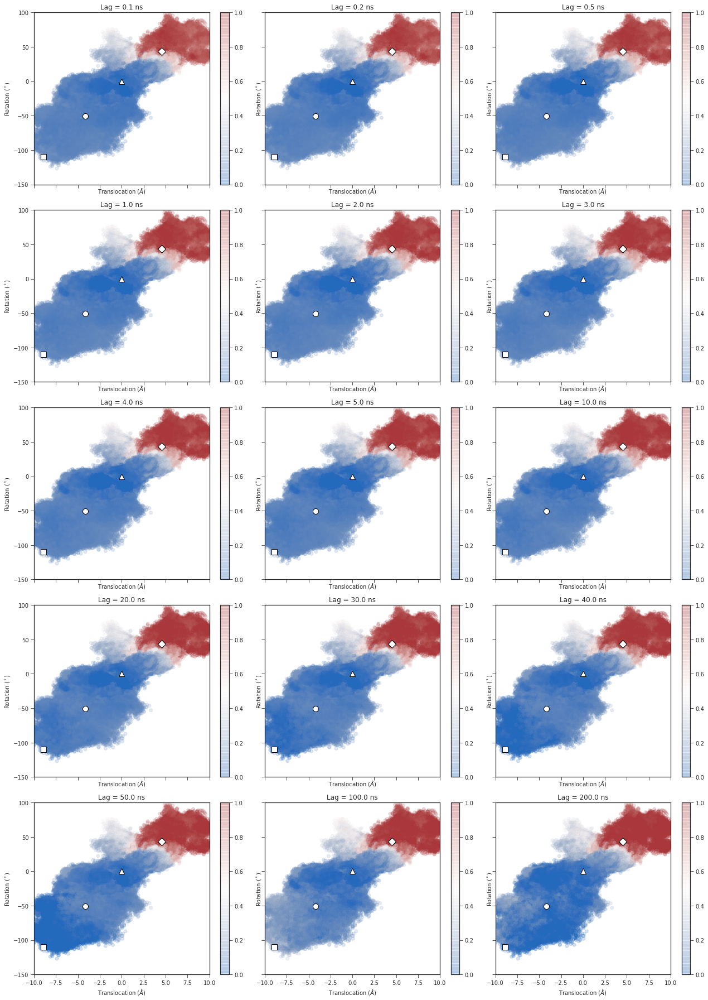

In [145]:
f, axs = plt.subplots(5, 3, figsize=(18, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup_2, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0, max=1)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

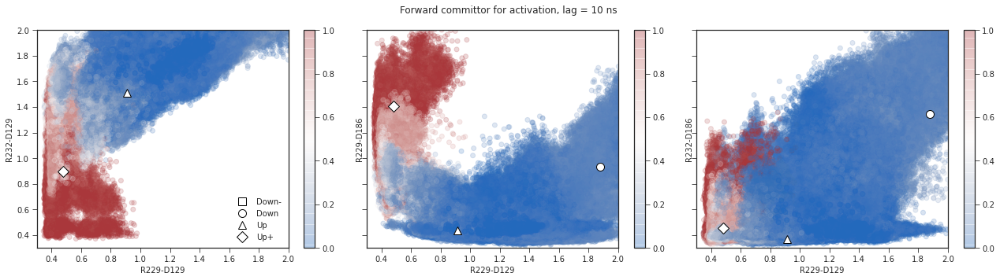

In [147]:
# projection on salt bridges
# R3-D129 vs
f, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=True)
q = np.concatenate(q_downup_2[8]).clip(min=0, max=1)
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 2], cv_arr[::10, i + 3], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[2], ylabel=names[i + 3], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axs[1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axs[2], feat2_models[:, 48:60:11])  # 48 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

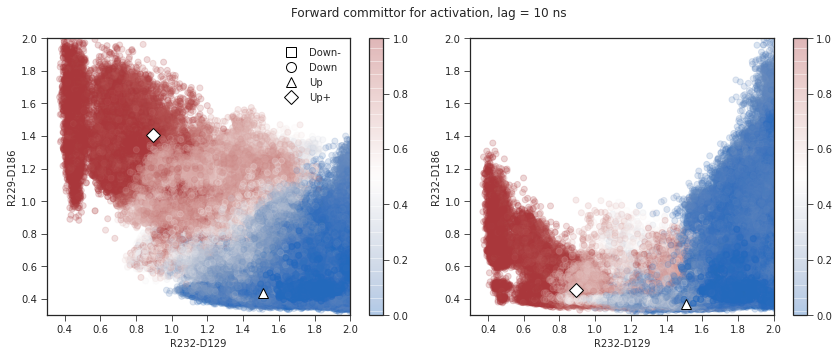

In [148]:
f, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
q = np.concatenate(q_downup_2[8]).clip(min=0, max=1)
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 3], cv_arr[::10, i + 4], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[3], ylabel=names[i + 4], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axs[1], feat2_models[:, 54:60:5])  # 54 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  if sys.path[0] == '':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


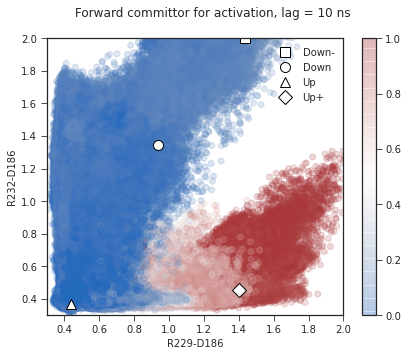

In [149]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup_2[8]).clip(min=0, max=1)
h = ax.scatter(cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlabel=names[4], ylabel=names[5], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(ax, feat2_models[:, 53:60:6])  # 53 and 59
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

#### Correlation between committor and CVs 

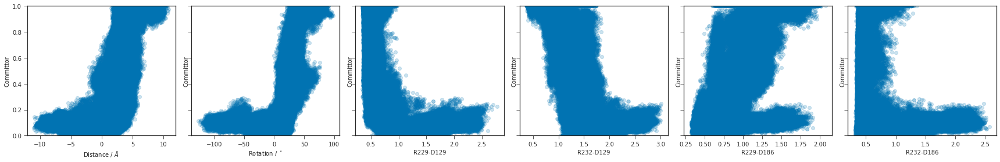

In [153]:
f, axs = plt.subplots(1, 6, figsize=(24, 4), sharey=True)
for i, ax in enumerate(axs):
    ax.scatter(cv_arr[::10, i], q[::10], alpha=0.2)
    ax.set_xlabel(names[i])
    ax.set_ylabel("Committor")
    ax.set_ylim([0, 1])
f.tight_layout()

### Committor 0.5 

In [154]:
# q 0.5
ids = ((q - 0.5) ** 2).argsort()
for idx in ids[:20]:
    print(f"{util.frame(idx)}: {q[idx]}, {cv_arr[idx, :6]}")

(416, 880): 0.4999990070158837, [ 2.185      35.415       0.42851847  1.26857805  1.03931236  0.38419014]
(308, 65): 0.5000012730908109, [ 1.418      24.961       0.47787124  1.6587286   1.18355954  0.3713828 ]
(815, 1307): 0.49999771437856066, [ 2.2        31.324       0.43491036  1.17096114  0.97929221  0.38019222]
(682, 2229): 0.4999972137466414, [ 3.892      24.909       0.44234273  1.57329369  1.10535622  0.6090939 ]
(815, 626): 0.49999661204711376, [ 2.154      27.549       0.44719791  1.07230246  1.01270509  0.38910803]
(869, 2276): 0.5000035012152665, [ 2.491      21.733       0.46600524  1.41021907  1.11952603  0.38690934]
(214, 2420): 0.4999960362996097, [2.509      7.003      0.45741683 1.36872697 1.30160892 0.42699069]
(1141, 4800): 0.5000058946679101, [ 2.716      20.898       0.49034682  1.35178316  1.23426223  0.40031123]
(256, 2154): 0.49999338563921647, [ 3.533      17.532       0.37882185  1.51498699  1.3147006   0.37115753]
(416, 1672): 0.4999932135853771, [ 1.199   

In [163]:
# what about points near 0.7, 1.0 in R3-D129 / R4-D129 space?
# q 0.5
ids = ((q - 0.5) ** 2 + (cv_arr[:, 2] - 0.7) ** 2 + (cv_arr[:, 3] - 1.0) ** 2).argsort()
for idx in ids[:10]:
    traj, _ = util.frame(idx)
    print(f"{util.frame(idx)}: {q[idx]:.3f}, {cv_arr[idx, :6]}")

(1039, 2966): 0.491, [ 4.519      32.631       0.69576502  1.0030638   0.58539647  0.39970115]
(867, 945): 0.510, [ 4.783      31.09        0.69863439  1.00716746  0.63850695  0.37846422]
(1039, 4894): 0.501, [ 4.839      37.843       0.68909949  1.0104208   0.62694019  0.38188213]
(331, 579): 0.486, [ 2.782      31.836       0.69789779  1.00534272  0.62830138  0.38887003]
(797, 2568): 0.514, [ 4.47       35.159       0.69203532  1.00096333  0.62046242  0.40347114]
(1039, 3008): 0.512, [ 4.826      43.15        0.6919871   1.00928199  0.62269574  0.40782109]
(1039, 4502): 0.508, [ 4.672      36.773       0.68527442  0.99495989  0.64256757  0.40665838]
(1039, 2959): 0.513, [ 4.892      34.579       0.69231498  0.98978943  0.57257056  0.43837199]
(867, 879): 0.484, [ 4.627      32.096       0.68917042  0.9988519   0.61226141  0.38375127]
(1039, 1085): 0.484, [ 4.89       34.655       0.70277953  1.01253104  0.55256861  0.39184189]


Text(0.5, 0.98, 'Forward committor for activation, lag = 10 ns')

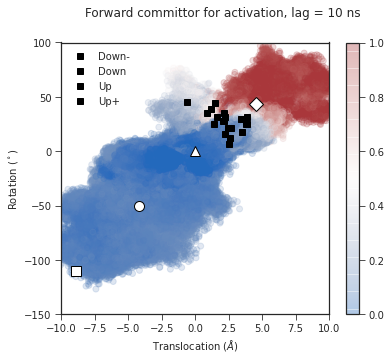

In [155]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup_2[8]).clip(min=0, max=1)
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)
for idx in ids[:20]:
    ax.plot(cv_arr[idx, 0], cv_arr[idx, 1], "sk")
ax.set(xlabel=names[0], ylabel=names[1])
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")

Text(0.5, 0.98, 'Forward committor for activation, lag = 10 ns')

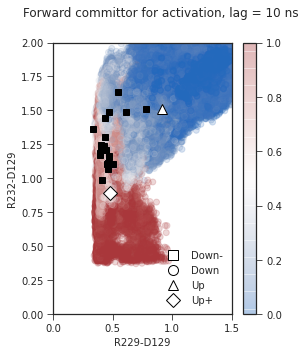

In [175]:
f, ax = plt.subplots(figsize=(4, 5))
q = np.concatenate(q_downup_2[8]).clip(min=0, max=1)
h = ax.scatter(cv_arr[::10, 2], cv_arr[::10, 3], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlim=[0, 1.5], ylim=[0, 2.0])
util.plot_models(ax, feat2_models[:, 48:55:6])  # indexes 48 and 54
for idx in ids[:20]:
    ax.plot(cv_arr[idx, 2], cv_arr[idx, 3], "sk")
ax.set(xlabel=names[2], ylabel=names[3])
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")

# Recompute committors using distance basis with COM in feature 5 TICA basis 

In [156]:
weights = np.load("../../data/coms_feat5_ind200_fix.npy", allow_pickle=True)

In [161]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 30
Calculating committors for lag 40
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 300
Calculating committors for lag 400
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [162]:
np.save("../../data/feat2_dist_fix/q_du_feat5com.npy", q_downup)
np.save("../../data/feat2_dist_fix/qb_du_feat5com.npy", qb_downup)
np.save("../../data/feat2_dist_fix/q_ud_feat5com.npy", q_updown)
np.save("../../data/feat2_dist_fix/qb_ud_feat5com.npy", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


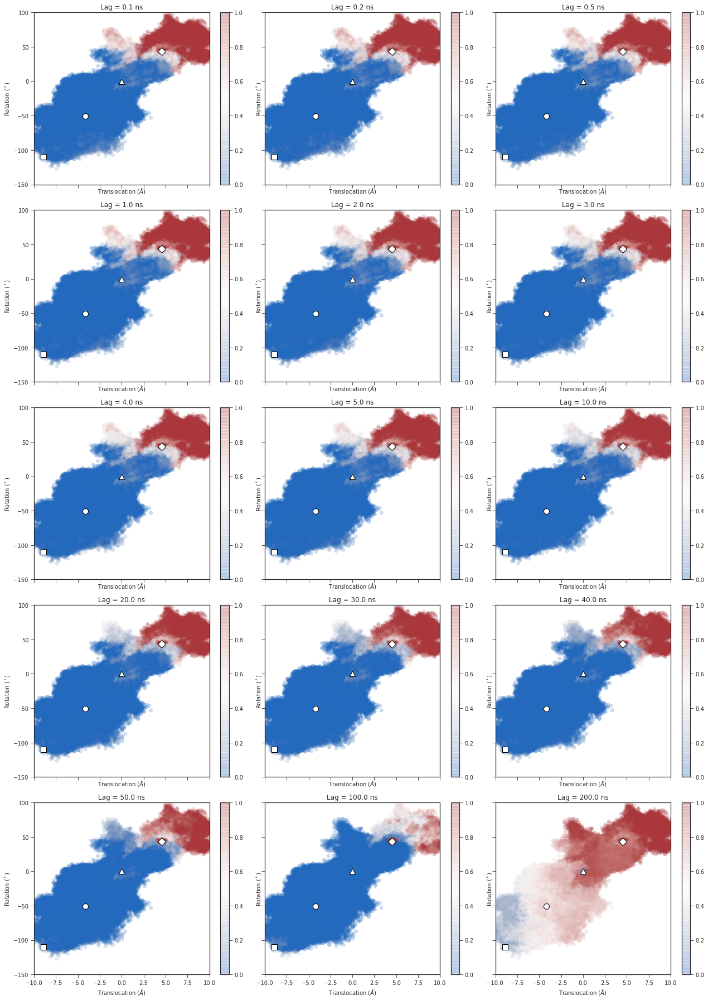

In [164]:
f, axs = plt.subplots(5, 3, figsize=(18, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0, max=1)
    h = ax.scatter(
        cv_arr[::10, 0], cv_arr[::10, 1], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)

f.tight_layout()

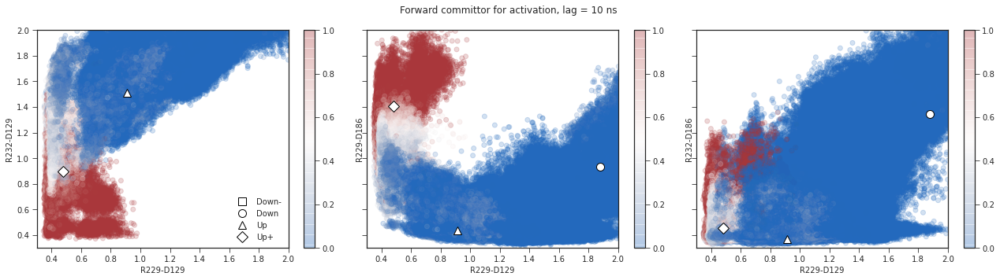

In [165]:
# projection on salt bridges
# R3-D129 vs
f, axs = plt.subplots(1, 3, figsize=(18, 5), sharex=True, sharey=True)
q = np.concatenate(q_downup[8]).clip(min=0, max=1)
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 2], cv_arr[::10, i + 3], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[2], ylabel=names[i + 3], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axs[1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axs[2], feat2_models[:, 48:60:11])  # 48 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

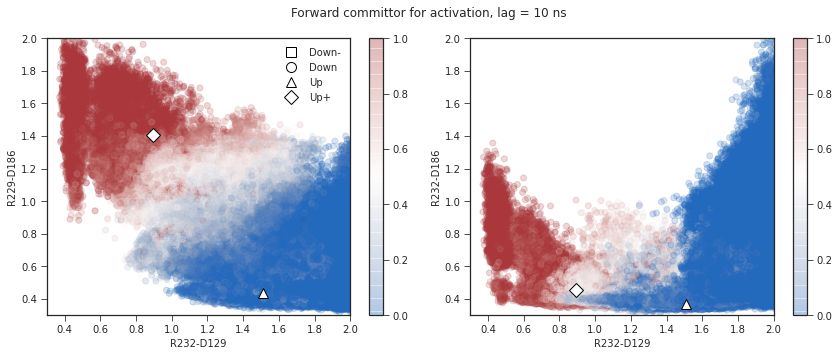

In [166]:
f, axs = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
q = np.concatenate(q_downup[8]).clip(min=0, max=1)
for i, ax in enumerate(axs):
    h = ax.scatter(
        cv_arr[::10, 3], cv_arr[::10, i + 4], c=q[::10], cmap="vlag", alpha=0.2
    )
    plt.colorbar(h, ax=ax)
    ax.set(xlabel=names[3], ylabel=names[i + 4], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(axs[0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axs[1], feat2_models[:, 54:60:5])  # 54 and 59
axs[0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  if sys.path[0] == '':
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


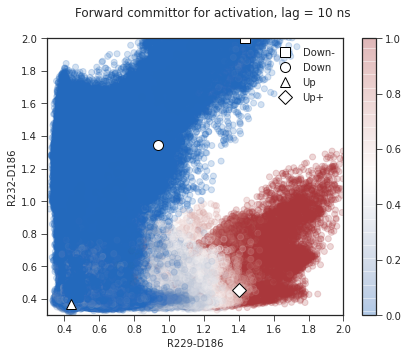

In [167]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup[8]).clip(min=0, max=1)
h = ax.scatter(cv_arr[::10, 4], cv_arr[::10, 5], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
ax.set(xlabel=names[4], ylabel=names[5], xlim=[0.3, 2], ylim=[0.3, 2])
util.plot_models(ax, feat2_models[:, 53:60:6])  # 53 and 59
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")
f.tight_layout()

In [170]:
# q 0.5
ids = ((q - 0.5) ** 2).argsort()
for idx in ids[:20]:
    print(f"{util.frame(idx)}: {q[idx]}, {cv_arr[idx, :6]}")

(858, 257): 0.500000299150854, [ 1.217      41.829       0.45390972  1.10416305  0.88408452  0.37760696]
(1142, 6173): 0.5000007875480633, [ 2.687      35.955       0.43818036  1.30717957  1.11467755  0.41259423]
(848, 73): 0.5000012492522649, [ 1.736      28.413       0.46736065  1.16348231  1.18061113  0.36129087]
(1185, 89961): 0.49999786451867045, [ 3.81       23.421       0.77816194  1.51268446  1.21142602  0.36948749]
(999, 2623): 0.4999973474749797, [ 1.044      35.194       0.44465169  1.20880675  1.1954248   0.66380864]
(1092, 7084): 0.4999965149390476, [ 3.508      35.508       0.39573368  1.17105222  1.18856633  0.40181834]
(918, 2248): 0.4999954488213484, [ 0.824      32.099       0.40511131  1.24265301  1.17171538  0.38532332]
(1185, 77425): 0.5000045549177158, [ 4.116      24.751       0.611485    1.49212408  1.19480097  0.38004607]
(1185, 29109): 0.5000048667018682, [ 4.691      38.135       0.49974099  1.10606015  1.18255365  0.39506325]
(1092, 3978): 0.499994752377041,

Text(0.5, 0.98, 'Forward committor for activation, lag = 10 ns')

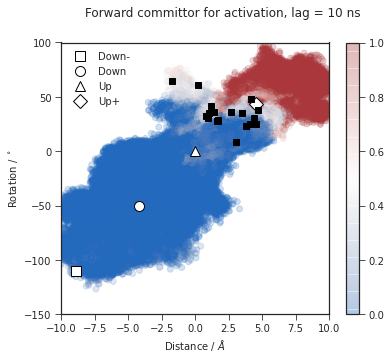

In [172]:
f, ax = plt.subplots(figsize=(6, 5))
q = np.concatenate(q_downup[8]).clip(min=0, max=1)
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=q[::10], cmap="vlag", alpha=0.2)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)
for idx in ids[:20]:
    ax.plot(cv_arr[idx, 0], cv_arr[idx, 1], "sk")
ax.set(xlabel=names[0], ylabel=names[1])
ax.legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("Forward committor for activation, lag = 10 ns")

In [169]:
# what about points near 0.7, 1.0 in R3-D129 / R4-D129 space?
# q 0.5
ids = ((q - 0.5) ** 2 + (cv_arr[:, 2] - 0.7) ** 2 + (cv_arr[:, 3] - 1.0) ** 2).argsort()
for idx in ids[:10]:
    traj, _ = util.frame(idx)
    print(f"{util.frame(idx)}: {q[idx]:.3f}, {cv_arr[idx, :6]}")

(747, 1719): 0.475, [ 5.057      34.663       0.68087882  0.97567105  0.60714895  0.39427149]
(1145, 3618): 0.531, [ 3.778      44.834       0.66539466  1.02288365  0.66236097  0.39519766]
(1138, 182): 0.488, [ 2.899      31.343       0.65134329  1.02022946  0.67565453  0.41839337]
(1138, 342): 0.469, [ 4.317      35.059       0.66497672  1.02762783  0.60434932  0.56234783]
(747, 1702): 0.477, [ 4.474      32.236       0.6508649   0.97848719  0.64869148  0.3829478 ]
(1043, 4542): 0.533, [ 4.904      51.641       0.66046739  1.03559363  0.62886006  0.42501521]
(747, 1478): 0.450, [ 3.58       29.832       0.66282195  1.01047397  0.65302843  0.39342725]
(747, 1709): 0.445, [ 4.245      27.441       0.66748643  1.00479352  0.61933589  0.38258728]
(1138, 263): 0.462, [ 3.92       34.411       0.65354574  1.0245204   0.59047943  0.67620265]
(1145, 3445): 0.538, [ 5.267      44.177       0.66754556  1.04115081  0.69601786  0.39095134]
